In [0]:
###IMPORTS###
%matplotlib inline

import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data
from torchvision import datasets, transforms
import numpy as np
import torchvision
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
import tensorflow as tf
from PIL import Image
from torch.autograd import Variable
from chainer import datasets
import torchvision.datasets as dsets
import itertools
import pickle

In [0]:
###MOUNT GOOGLE DRIVE###
from google.colab import drive
# drive.mount('/content/gdrive')
drive.mount("/content/gdrive", force_remount=True)

Mounted at /content/gdrive


In [0]:
###LOADING SIMPSONS DATA###

#Get the master path of simpsons data
simpson_path = '/content/gdrive/My Drive/APS360 Project/TrainImages/simpson'

imgsize=120

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((imgsize, imgsize)), transforms.ToTensor()])

# Load data from Google Drive
dataset_simpson = torchvision.datasets.ImageFolder(simpson_path, transform=transform)

# Prepare Dataloader
batch_size = 32
num_workers = 4
train_loader_simpson = torch.utils.data.DataLoader(dataset_simpson, batch_size=batch_size, num_workers=num_workers, shuffle=True)

In [0]:
###LOADING HUMAN FACES DATA###

human_path ='/content/gdrive/My Drive/APS360 Project/TrainImages/real'
dataset_human = torchvision.datasets.ImageFolder(human_path, transform=transform)
train_loader_human = torch.utils.data.DataLoader(dataset_human, batch_size=batch_size, num_workers=num_workers, shuffle=True)

In [0]:
a_real_data = Variable(iter(train_loader_human).next()[0], volatile=True)
b_real_data = Variable(iter(train_loader_simpson).next()[0], volatile=True)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: UserWarning: volatile was removed and now has no effect. Use `with torch.no_grad():` instead.
  


In [0]:
a_real_data.shape

torch.Size([32, 3, 120, 120])

In [0]:

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        input_nc=3
        output_nc=3
        # Initial convolution block       
        model = [   nn.ReflectionPad2d(3),
                    nn.Conv2d(input_nc, 64, 7),
                    nn.InstanceNorm2d(64),
                    nn.ReLU(inplace=True) ]
        #conv layers
        in_features = 64
        out_features = in_features*2
        model += [  nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                    nn.InstanceNorm2d(out_features),
                    nn.ReLU(inplace=True) ]
        in_features = out_features
        out_features = in_features*2
        model += [  nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                    nn.InstanceNorm2d(out_features),
                    nn.ReLU(inplace=True) ]
        in_features = out_features
        out_features = in_features*2
        # transpose conv layers
        out_features = in_features//2

        model += [  nn.ConvTranspose2d(in_features, out_features, 3, stride=2, padding=1, output_padding=1),
                    nn.InstanceNorm2d(out_features),
                    nn.ReLU(inplace=True) ]
        in_features = out_features
        out_features = in_features//2

        model += [  nn.ConvTranspose2d(in_features, out_features, 3, stride=2, padding=1, output_padding=1),
                    nn.InstanceNorm2d(out_features),
                    nn.ReLU(inplace=True) ]
        in_features = out_features
        out_features = in_features//2
        # Output layer
        model += [  nn.ReflectionPad2d(3),
                    nn.Conv2d(64, output_nc, 7),
                    nn.ReLU(inplace=True) ]

        self.model = nn.Sequential(*model)
    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        input_nc=3


        model = [   nn.Conv2d(input_nc, 64, 4, stride=2, padding=1),
                    nn.LeakyReLU(0.2, inplace=True) ]

        model += [  nn.Conv2d(64, 128, 4, stride=2, padding=1),
                    nn.InstanceNorm2d(128), 
                    nn.LeakyReLU(0.2, inplace=True) ]

        model += [  nn.Conv2d(128, 256, 4, stride=2, padding=1),
                    nn.InstanceNorm2d(256), 
                    nn.LeakyReLU(0.2, inplace=True) ]

        model += [  nn.Conv2d(256, 512, 4, padding=1),
                    nn.InstanceNorm2d(512), 
                    nn.LeakyReLU(0.2, inplace=True) ]


        model += [nn.Conv2d(512, 1, 4, padding=1)]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        x =  self.model(x)

        return F.avg_pool2d(x, x.size()[2:]).view(x.size()[0], -1)




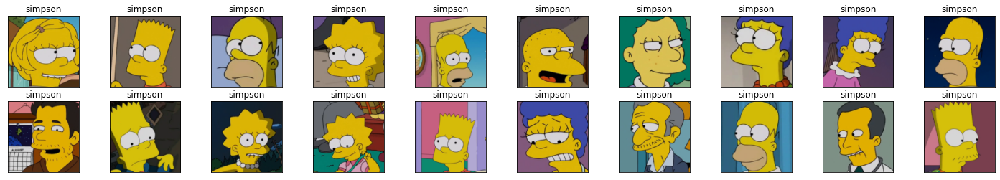

In [0]:
#Making the loader an iterator and then creating photos

#Create the iterator object and get first batch
dataiter = iter(train_loader_simpson)
images, labels = dataiter.next()

#Convert the arrays to numpy type and create figure & classes
images = images.numpy() # convert images to numpy for display
fig = plt.figure(figsize=(25, 4))
classes = ['simpson']

#Plot the first 20 images as subplots
for idx in np.arange(20):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[0])

In [0]:
Tensor = torch.cuda.FloatTensor

target_real = Variable(Tensor(batch_size).fill_(1.0), requires_grad=False)
target_fake = Variable(Tensor(batch_size).fill_(0.0), requires_grad=False)

In [0]:
def train(netG_A2B, netG_B2A, netD_A, netD_B,target_fake=target_fake,target_real=target_real, lr=0.0002, num_epochs=20,imgsize=imgsize):

    # optimizers for generator and discriminator

    criterion_GAN = torch.nn.MSELoss()
    criterion_cycle = torch.nn.L1Loss()
    criterion_identity = torch.nn.L1Loss()

    optimizer_G = torch.optim.Adam(itertools.chain(netG_A2B.parameters(), netG_B2A.parameters()),
                                    lr=lr, betas=(0.5, 0.999))
    optimizer_D_A = torch.optim.Adam(netD_A.parameters(), lr=lr, betas=(0.5, 0.999))
    optimizer_D_B = torch.optim.Adam(netD_B.parameters(), lr=lr, betas=(0.5, 0.999))




    # keep track of loss and generated, "fake" samples
    samples = []
    losses = []

    for epoch in range(num_epochs):
        netD_A.train()
        netD_B.train()
        netG_A2B.train()
        netG_B2A.train()
        
        for batch_i, (real_A, real_B) in enumerate(zip(train_loader_human, train_loader_simpson)):
            
            # batch_size = real_images_s.size(0)
            real_A = Variable(real_A[0])
            real_B = Variable(real_B[0])
            real_A = real_A.cuda()
            real_B = real_B.cuda()


            # === Train the Generators A2B and B2A ===
            optimizer_G.zero_grad()
      


            #Identity Loss
            # Identity loss
            # G_A2B(B) should equal B if real B is fed
            same_B = netG_A2B(real_B)
            loss_identity_B = criterion_identity(same_B, real_B)*5.0
            # G_B2A(A) should equal A if real A is fed
            same_A = netG_B2A(real_A)
            loss_identity_A = criterion_identity(same_A, real_A)*5.0

            # GAN loss
            fake_B = netG_A2B(real_A)
            pred_fake = netD_B(fake_B)
            loss_GAN_A2B = criterion_GAN(pred_fake, target_real)

            fake_A = netG_B2A(real_B)
            pred_fake = netD_A(fake_A)
            loss_GAN_B2A = criterion_GAN(pred_fake, target_real)

            # Cycle loss
            recovered_A = netG_B2A(fake_B)
            loss_cycle_ABA = criterion_cycle(recovered_A, real_A)*10.0

            recovered_B = netG_A2B(fake_A)
            loss_cycle_BAB = criterion_cycle(recovered_B, real_B)*10.0

            # Total loss
            loss_G = loss_identity_A + loss_identity_B + loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB
            loss_G.backward()
            
            optimizer_G.step()

            ########################################################

            #===== Discriminator A =====#
            optimizer_D_A.zero_grad()

            # Real loss
            pred_real = netD_A(real_A)
            loss_D_real = criterion_GAN(pred_real, target_real)

            # Fake loss
            # fake_A = fake_A_buffer.push_and_pop(fake_A)
            pred_fake = netD_A(fake_A.detach())
            loss_D_fake = criterion_GAN(pred_fake, target_fake)

            # Total loss
            loss_D_A = (loss_D_real + loss_D_fake)*0.5
            loss_D_A.backward()

            optimizer_D_A.step()

            #######################################################

            #========= Discriminator B ======#
            optimizer_D_B.zero_grad()

            # Real loss
            pred_real = netD_B(real_B)
            loss_D_real = criterion_GAN(pred_real, target_real)
            
            # Fake loss
            # fake_B = fake_B_buffer.push_and_pop(fake_B)
            pred_fake = netD_B(fake_B.detach())
            loss_D_fake = criterion_GAN(pred_fake, target_fake)

            # Total loss
            loss_D_B = (loss_D_real + loss_D_fake)*0.5
            loss_D_B.backward()

            optimizer_D_B.step()

            ######################################################

        # print loss
        print('Epoch [%d/%d], g_loss: %.4f, d_A_loss: %.4f, d_B_loss: %.4f' % (epoch + 1, num_epochs, loss_G.item(), loss_D_A.item(), loss_D_B.item()))


        # append discriminator loss and generator loss
        losses.append({'loss_G': loss_G, 'loss_G_identity': (loss_identity_A + loss_identity_B), 'loss_G_GAN': (loss_GAN_A2B + loss_GAN_B2A),
                    'loss_G_cycle': (loss_cycle_ABA + loss_cycle_BAB), 'loss_D': (loss_D_A + loss_D_B), 'loss_GAN_A2B':loss_GAN_A2B, 
                    'loss_GAN_B2A':loss_GAN_B2A,'loss_D_A':loss_D_A,'loss_D_B':loss_D_B,
                     'real_A': real_A, 'real_B': real_B, 'fake_A': fake_A, 'fake_B': fake_B})
        
        # plot images
        #G.eval()
        #D.eval()
        #test_images = G(test_noise)

        #plt.figure(figsize=(9, 3))
        #for k in range(16):
        #    plt.subplot(2, 8, k+1)
        #    plt.imshow(test_images[k,:].data.numpy().reshape(28, 28), cmap='Spectral')
       # plt.show()

        torch.save(netG_A2B.state_dict(), 'gdrive/My Drive/APS360 Project/tmpvar/netG_A2B%d.pth'% epoch)
        torch.save(netG_B2A.state_dict(), 'gdrive/My Drive/APS360 Project/tmpvar/netG_B2A%d.pth'% epoch)
        torch.save(netD_A.state_dict(), 'gdrive/My Drive/APS360 Project/tmpvar/netD_A%d.pth'% epoch)
        torch.save(netD_B.state_dict(), 'gdrive/My Drive/APS360 Project/tmpvar/netD_B%d.pth'% epoch)
        


        pickle_out = open("gdrive/My Drive/APS360 Project/tmpvar/dict.pickle","wb")
        pickle.dump(losses, pickle_out)
        pickle_out.close()
    
    return losses

In [0]:
torch.cuda.empty_cache()
netD_A = Discriminator()
netD_B = Discriminator()
netG_A2B = Generator()
netG_B2A = Generator()
netG_A2B.cuda()
netG_B2A.cuda()
netD_A.cuda()
netD_B.cuda()

losses=train(netG_A2B, netG_B2A, netD_A, netD_B,target_fake=target_fake,target_real=target_real, lr=0.0002, num_epochs=50,imgsize=imgsize)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:431: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([32, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:431: UserWarning: Using a target size (torch.Size([32])) that is different to the input size (torch.Size([9, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/50], g_loss: 4.2953, d_A_loss: 0.1503, d_B_loss: 0.1559
Epoch [2/50], g_loss: 4.2285, d_A_loss: 0.1725, d_B_loss: 0.1357
Epoch [3/50], g_loss: 4.4508, d_A_loss: 0.1523, d_B_loss: 0.1209
Epoch [4/50], g_loss: 3.9507, d_A_loss: 0.0964, d_B_loss: 0.1138
Epoch [5/50], g_loss: 3.9022, d_A_loss: 0.0618, d_B_loss: 0.0668
Epoch [6/50], g_loss: 3.7354, d_A_loss: 0.0892, d_B_loss: 0.0455
Epoch [7/50], g_loss: 4.2761, d_A_loss: 0.0727, d_B_loss: 0.0575
Epoch [8/50], g_loss: 3.9885, d_A_loss: 0.0446, d_B_loss: 0.0745
Epoch [9/50], g_loss: 3.8543, d_A_loss: 0.1221, d_B_loss: 0.0891
Epoch [10/50], g_loss: 3.7421, d_A_loss: 0.0685, d_B_loss: 0.0523
Epoch [11/50], g_loss: 4.0685, d_A_loss: 0.0743, d_B_loss: 0.0482
Epoch [12/50], g_loss: 4.2596, d_A_loss: 0.1456, d_B_loss: 0.1631
Epoch [13/50], g_loss: 3.9884, d_A_loss: 0.0727, d_B_loss: 0.0361
Epoch [14/50], g_loss: 3.5682, d_A_loss: 0.0632, d_B_loss: 0.0338
Epoch [15/50], g_loss: 4.3365, d_A_loss: 0.1155, d_B_loss: 0.0682
Epoch [16/50], g_lo

In [0]:
pickle_in = open("gdrive/My Drive/APS360 Project/tmpvar/dict.pickle","rb")
losses = pickle.load(pickle_in)

In [0]:
#load from state dictionary
AB=[]
BA=[]
for i in range(50):
  AB.append(Generator())
  BA.append(Generator())

  PATH = 'gdrive/My Drive/APS360 Project/tmpvar/netG_A2B%d.pth' % i
  AB[i].load_state_dict(torch.load(PATH))
  AB[i].eval()
  
  PATH = 'gdrive/My Drive/APS360 Project/tmpvar/netG_B2A%d.pth' % i
  BA[i].load_state_dict(torch.load(PATH))
  BA[i].eval()

ERROR! Session/line number was not unique in database. History logging moved to new session 59


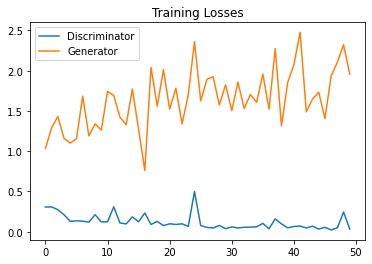

In [0]:
%matplotlib inline

import matplotlib.pyplot as plt

dloss=[x['loss_D'] for x in losses]
gloss=[x['loss_G_GAN'] for x in losses]

fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(dloss, label='Discriminator')
plt.plot(gloss, label='Generator')
plt.title("Training Losses")
plt.legend()

plt.savefig('trainingloss.png', dpi=2000)

In [0]:
i=49
netG_A2B=AB[i]
netG_B2A=BA[i]

In [0]:
# simg=simages[17]
# shimg=images[17]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


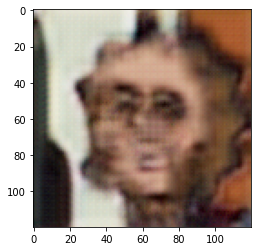

In [0]:

plt.imshow(np.transpose(himg, (1, 2, 0)))
plt.imshow(np.transpose(hsimg, (1, 2, 0)))
plt.imshow(np.transpose(simg, (1, 2, 0)))
plt.imshow(np.transpose(shimg, (1, 2, 0)))

In [0]:
images= netG_A2B(torch.from_numpy(np.expand_dims(himg,axis=0))).detach()

torch.Size([1, 3, 120, 120])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

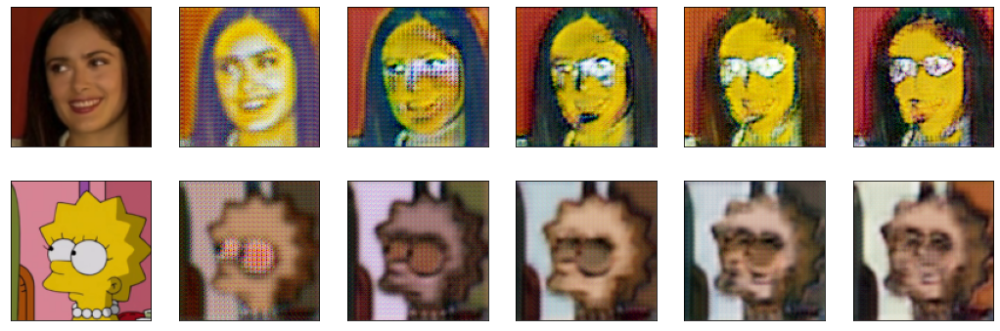

In [0]:
fig = plt.figure(figsize=(15, 6))
classes = ['']

ax = fig.add_subplot(2, 6, 1, xticks=[], yticks=[])
plt.imshow(np.transpose(himg, (1, 2, 0)))
ax.set_title(classes[0])

idx=2
for i in [0,9,19,34,49]:
    
    ax = fig.add_subplot(2, 6, idx, xticks=[], yticks=[])

    x=torch.from_numpy(np.expand_dims(himg,axis=0))
    x=AB[i](x)
    x=x.detach().numpy()

    plt.imshow(np.transpose(x[0], (1, 2, 0)))
    ax.set_title(classes[0])
    idx+=1

ax = fig.add_subplot(2, 6, 7, xticks=[], yticks=[])
plt.imshow(np.transpose(simg, (1, 2, 0)))
ax.set_title(classes[0])

idx=8
for i in [0,9,19,34,49]:
    
    ax = fig.add_subplot(2, 6, idx, xticks=[], yticks=[])

    x=torch.from_numpy(np.expand_dims(simg,axis=0))
    x=BA[i](x)
    x=x.detach().numpy()

    plt.imshow(np.transpose(x[0], (1, 2, 0)))
    ax.set_title(classes[0])
    idx+=1




#Plot the first 20 images as subplots


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

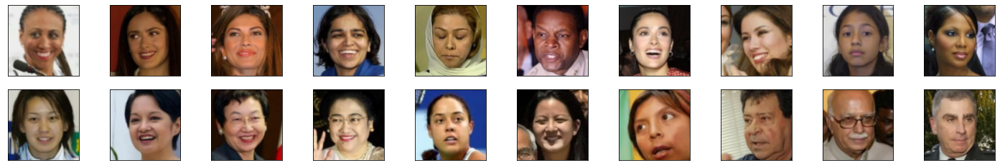

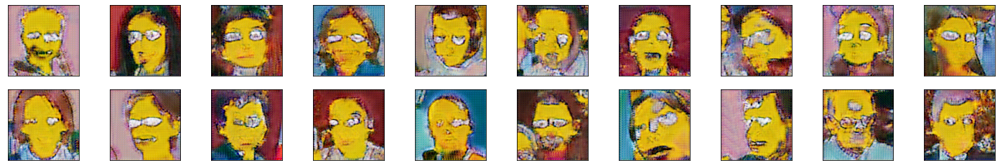

In [0]:
#Making the loader an iterator and then creating photos

#Create the iterator object and get first batch
dataiter = iter(train_loader_human)
images, labels = dataiter.next()
oi=images

#Convert the arrays to numpy type and create figure & classes
himages = images.numpy() # convert images to numpy for display
fig = plt.figure(figsize=(25, 4))
classes = ['']

#Plot the first 20 images as subplots
for idx in np.arange(20):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(himages[idx], (1, 2, 0)))
    ax.set_title(classes[0])


#Making the loader an iterator and then creating photos

#Create the iterator object and get first batch
images=oi

#Convert the arrays to numpy type and create figure & classes

netG_A2B.eval()

images= netG_A2B(images).detach()


images = images.numpy() # convert images to numpy for display
fig = plt.figure(figsize=(25, 4))
classes = ['']

#Plot the first 20 images as subplots
for idx in np.arange(20):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

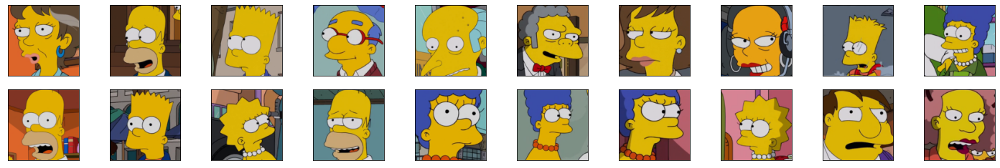

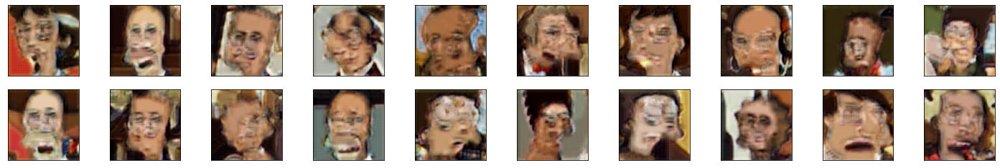

In [0]:
#Making the loader an iterator and then creating photos

#Create the iterator object and get first batch
dataiter = iter(train_loader_simpson)
images, labels = dataiter.next()
oi=images

#Convert the arrays to numpy type and create figure & classes
simages = images.numpy() # convert images to numpy for display
fig = plt.figure(figsize=(25, 4))
classes = ['']

#Plot the first 20 images as subplots
for idx in np.arange(20):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(simages[idx], (1, 2, 0)))
    ax.set_title(classes[0])


#Making the loader an iterator and then creating photos

#Create the iterator object and get first batch
images=oi

#Convert the arrays to numpy type and create figure & classes

netG_B2A.eval()
images=images
images= netG_B2A(images)
images=images.cpu().detach()

images = images.numpy() # convert images to numpy for display
fig = plt.figure(figsize=(25, 4))
classes = ['']

#Plot the first 20 images as subplots
for idx in np.arange(20):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[0])

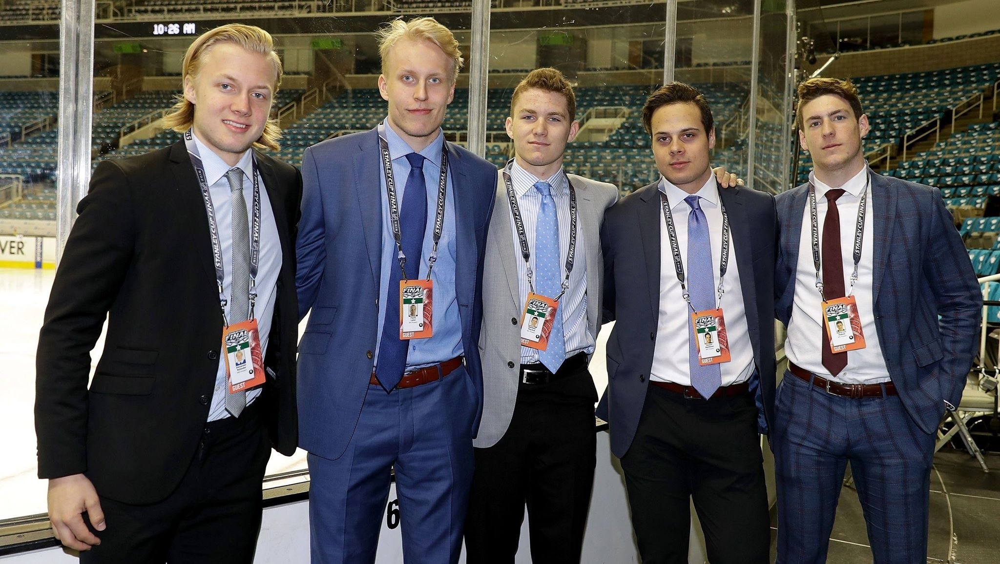

In [0]:
image = cv2.imread('55.jpg')
cv2_imshow(image)

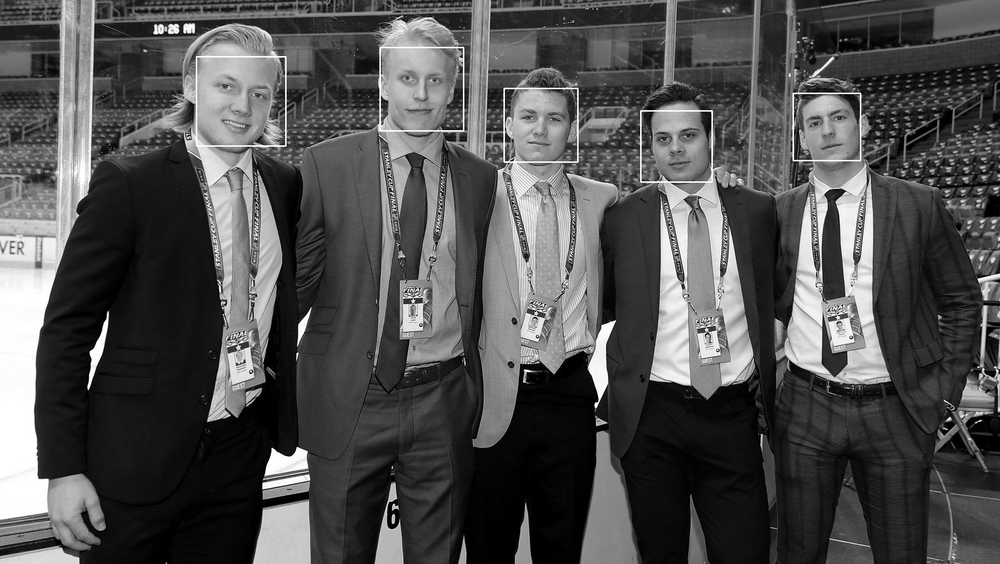

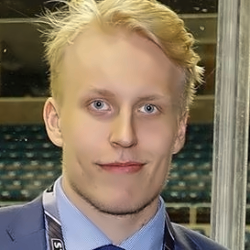

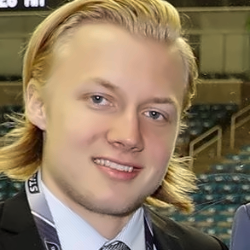

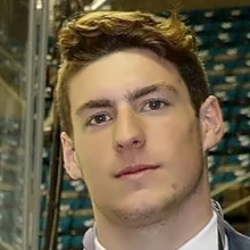

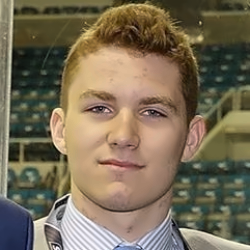

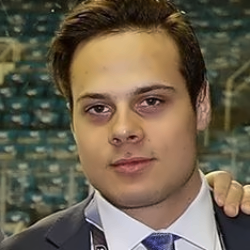

[[[0.13333333 0.11764706 0.0627451 ]
  [0.14117647 0.12156863 0.06666667]
  [0.14901961 0.12941176 0.07058824]
  ...
  [0.54901961 0.52156863 0.40392157]
  [0.53333333 0.50588235 0.39215686]
  [0.56862745 0.54117647 0.41960784]]

 [[0.1372549  0.11764706 0.05882353]
  [0.14509804 0.1254902  0.06666667]
  [0.15294118 0.13333333 0.0745098 ]
  ...
  [0.55294118 0.5254902  0.40784314]
  [0.55294118 0.5254902  0.40784314]
  [0.57647059 0.54901961 0.42352941]]

 [[0.18039216 0.16470588 0.09019608]
  [0.16470588 0.14901961 0.07843137]
  [0.14509804 0.12941176 0.06666667]
  ...
  [0.54901961 0.52156863 0.40392157]
  [0.54117647 0.51372549 0.39607843]
  [0.57647059 0.54901961 0.42352941]]

 ...

 [[0.32941176 0.36862745 0.49803922]
  [0.32941176 0.36862745 0.49803922]
  [0.32941176 0.36862745 0.49803922]
  ...
  [0.18039216 0.19607843 0.16078431]
  [0.22745098 0.25098039 0.20784314]
  [0.24705882 0.28235294 0.23529412]]

 [[0.32941176 0.36862745 0.49803922]
  [0.32941176 0.36862745 0.49803922]


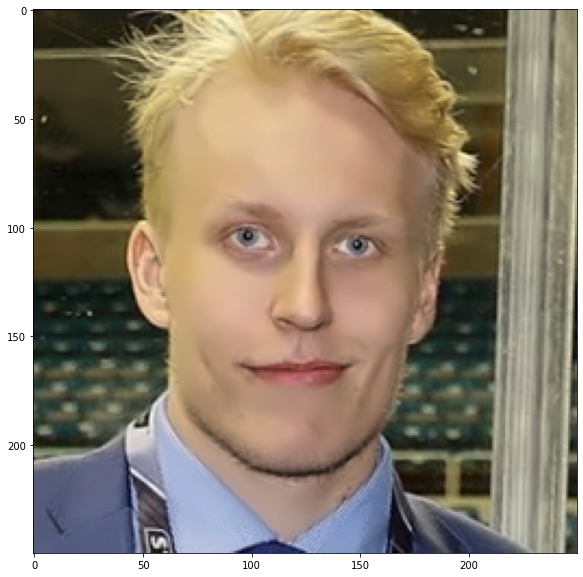

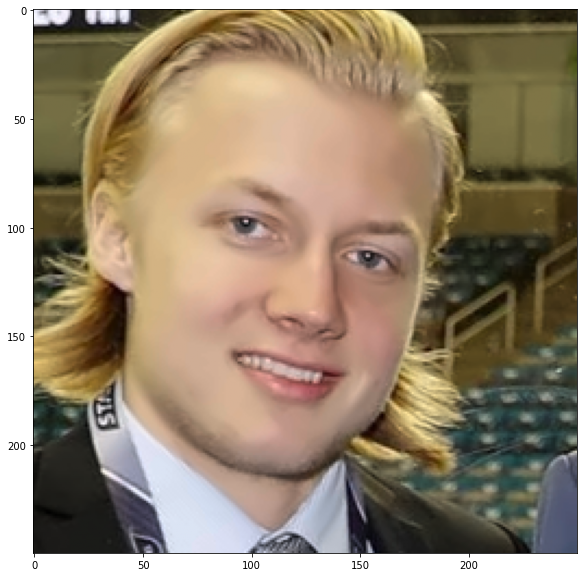

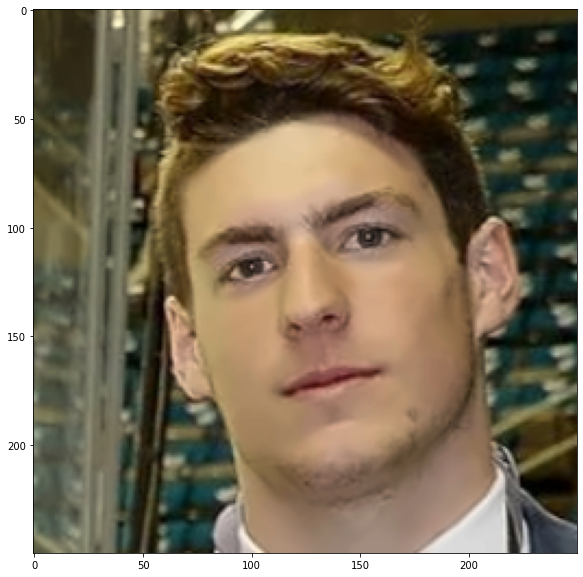

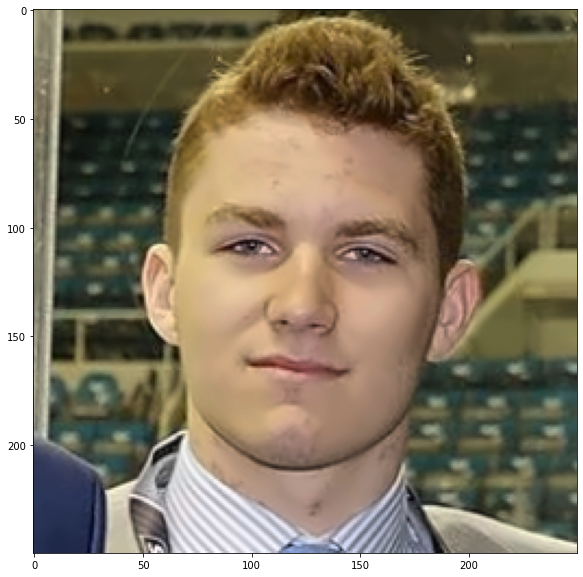

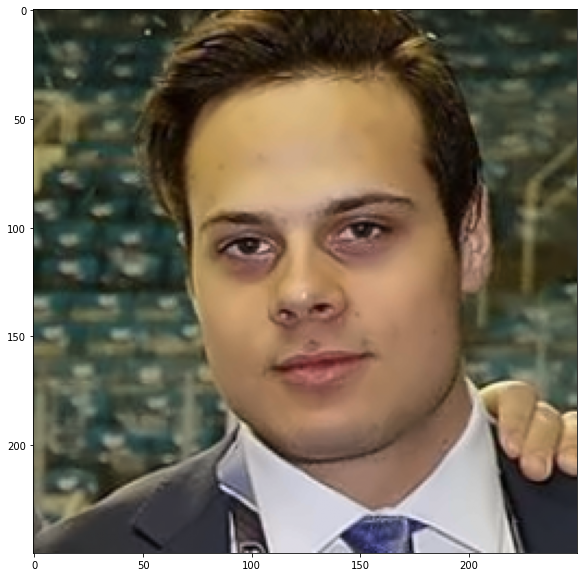

In [0]:
###RUN THE CODE FOR A SINGLE IMAGE (NEW IMAGE RESULT TESTING)###
## Take Care of Imports
import numpy as np
import cv2
import torch
import numpy as np
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

#Get the image
image = cv2.imread('55.jpg') #UPLOAD ANY PICTURE YOU WANT
face_cascade = cv2.CascadeClassifier('gdrive/My Drive/APS360 Project/data/haarcascades/haarcascade_frontalface_default.xml')


#Get the greyscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

#Convert to type uint8 to get it to work
gray_image = (gray_image).round().astype(np.uint8)

#Get the location of the faces
faces = face_cascade.detectMultiScale(gray_image, 1.3, 5)

#For the location of the face, plot the square
cleanimgs = []

#For each face, get the cropped photo and clean it
for (x,y,w,h) in faces:
  #Post the square on the picture
  img = cv2.rectangle(gray_image,(x,y),(x+w,y+h),(255,0,0),2)

  #Get the colour photo, clean and resize
  croppedimg = image[y-int(round(h*.3,0)):y+int(round(h*1.3,0)), x-int(round(w*.3,0)):x+int(round(w*1.3,0))]
  croppedimg = cv2.resize(croppedimg, (250,250))
  cleanimg = cv2.fastNlMeansDenoisingColored(croppedimg,None,2,2,7,21)
  cleanimgs.append(cleanimg)

#Print the face location
cv2_imshow(img)
pytorchready = []
for faceimage in cleanimgs:
  cv2_imshow(faceimage)
  pytorchready.append(cv2.cvtColor(faceimage, cv2.COLOR_BGR2RGB))

#Resize the pixel scale to 0-1
for i in range(len(pytorchready)):
  pytorchready[i] = pytorchready[i]/255
print(pytorchready[0])

#Print the face location for pytorch ready stuff
for plotimage in pytorchready:
  plt.figure(figsize=(10,10))
  plt.imshow(plotimage)
print(faces)

### PYTORCHREADY IS THE LIST OF FACE PHOTOS

Dataset ImageFolder
    Number of datapoints: 15
    Root location: /content/gdrive/My Drive/APS360 Project/TestPhotos
    StandardTransform
Transform: Compose(
               Resize(size=(120, 120), interpolation=PIL.Image.BILINEAR)
               ToTensor()
           )


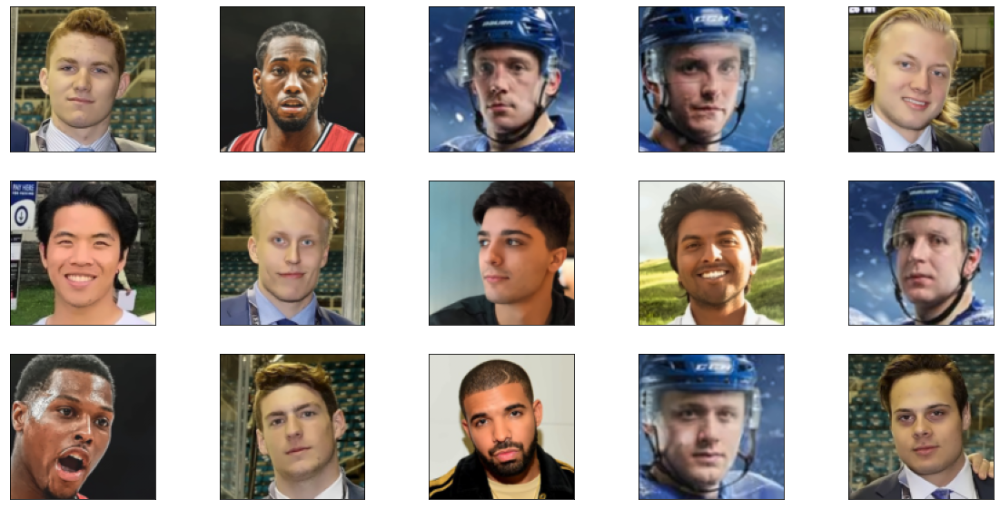

In [0]:
simpson_path = '/content/gdrive/My Drive/APS360 Project/TestPhotos'

imgsize=120

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((imgsize, imgsize)), transforms.ToTensor()])
# Load data from Google Drive
testdata = torchvision.datasets.ImageFolder(simpson_path, transform=transform)
print(testdata)
# Prepare Dataloader
batch_size = 15
num_workers = 1
testloader = torch.utils.data.DataLoader(testdata, batch_size=batch_size, num_workers=num_workers, shuffle=True)


#Create the iterator object and get first batch
dataiter = iter(testloader)
images, labels = dataiter.next()
oi=images


#Convert the arrays to numpy type and create figure & classes
images = images.numpy() # convert images to numpy for display
fig = plt.figure(figsize=(20, 10))
classes = ['']

#Plot the first 20 images as subplots
for idx in np.arange(15):
    ax = fig.add_subplot(3, 5, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[0])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

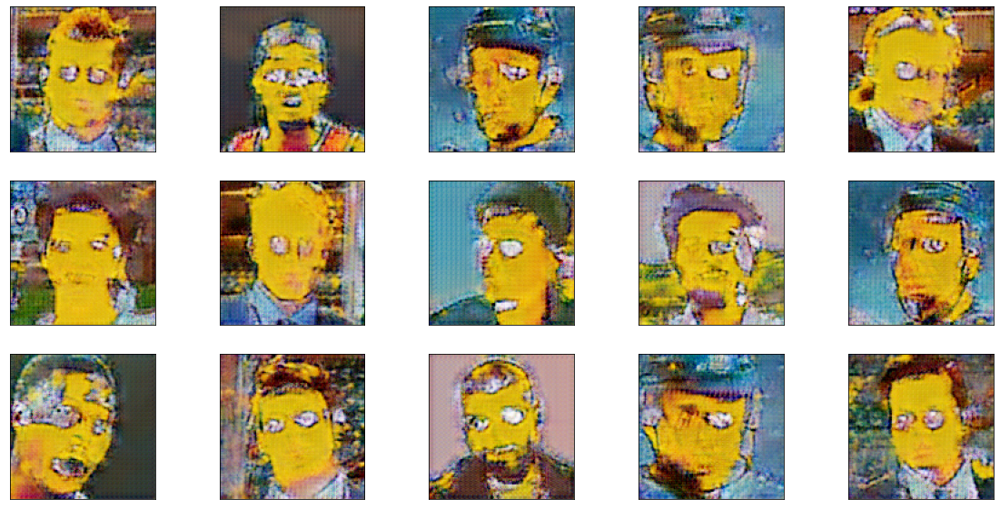

In [0]:

#Making the loader an iterator and then creating photos

#Create the iterator object and get first batch
images=oi

#Convert the arrays to numpy type and create figure & classes

netG_A2B.eval()

images= netG_A2B(images).detach()

#Convert the arrays to numpy type and create figure & classes
images = images.numpy() # convert images to numpy for display
fig = plt.figure(figsize=(20, 10))
classes = ['']

#Plot the first 20 images as subplots
for idx in np.arange(15):
    ax = fig.add_subplot(3, 5, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[0])


In [0]:
#evaluate SSIM
%matplotlib inline
import PIL
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import cv2
import imageio
from sklearn.metrics import mean_absolute_error
from skimage.measure import compare_ssim as ssim
from skimage.measure import compare_mse as mse #skimage.metrics.mean_squared_error
from skimage.measure import compare_psnr as psnr #skimage.metrics.peak_signal_noise_ratio

trains=[]
tests=[]


simpson_path = '/content/gdrive/My Drive/APS360 Project/TestPhotos'
imgsize=120

transform = transforms.Compose([transforms.Resize((imgsize, imgsize)), transforms.ToTensor()])
testdata = torchvision.datasets.ImageFolder(simpson_path, transform=transform)
batch_size = 15
num_workers = 1
testloader = torch.utils.data.DataLoader(testdata, batch_size=batch_size, num_workers=num_workers, shuffle=True)
dataiter = iter(testloader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display
testreal=images
x=torch.from_numpy(testreal)
# x=BA[i](x)
# x=x.detach().numpy()


for i in range(50):
  print(i)
  trainreal=losses[i]['real_A'].detach().cpu().numpy()
  trainfake=BA[i](AB[i](losses[i]['real_A'].detach().cpu()))
  trainfake=trainfake.detach().numpy()


  sum=0
  for j in range(len(trainfake)):
    sum+=ssim(np.transpose(trainreal[j],(1,2,0)),np.transpose(trainfake[j],(1,2,0)),multichannel=True)
  sum/=len(trainfake)
  trains.append(sum)

  testfake=BA[i](AB[i](x))
  testfake=testfake.detach().numpy()

  sum=0
  for j in range(len(testfake)):
    sum+=ssim(np.transpose(testreal[j],(1,2,0)),np.transpose(testfake[j],(1,2,0)),multichannel=True)
  sum/=len(testfake)
  tests.append(sum)

ERROR! Session/line number was not unique in database. History logging moved to new session 73
0


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:43: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:52: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


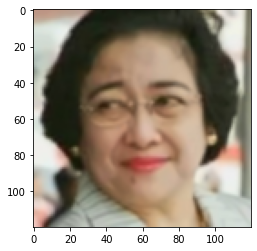

In [0]:
plt.imshow(np.transpose(trainreal[0],(1,2,0)))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


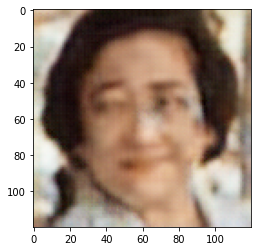

In [0]:
plt.imshow(np.transpose(trainfake[0],(1,2,0)))

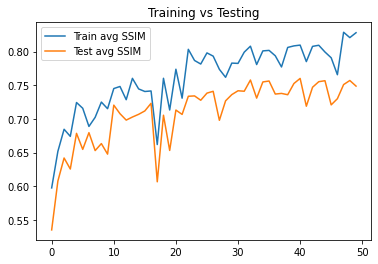

In [0]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(trains, label='Train avg SSIM')
plt.plot(tests, label='Test avg SSIM')
plt.title("Training vs Testing")
plt.legend()

plt.savefig('trainingloss.png', dpi=1000)

In [0]:
ssim(np.transpose(himg,(1,2,0)),np.transpose(himg,(1,2,0)),multichannel=True)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.
  """Entry point for launching an IPython kernel.


1.0

Dataset ImageFolder
    Number of datapoints: 3
    Root location: 1
    StandardTransform
Transform: Compose(
               Resize(size=(120, 120), interpolation=PIL.Image.BILINEAR)
               ToTensor()
           )


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


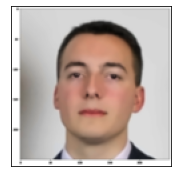

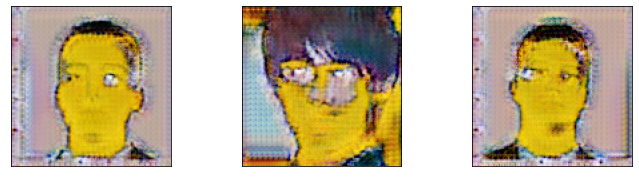

In [0]:
simpson_path = '1'

imgsize=120

# Transform Settings - Do not use RandomResizedCrop
transform = transforms.Compose([transforms.Resize((imgsize, imgsize)), transforms.ToTensor()])
# Load data from Google Drive
testdata = torchvision.datasets.ImageFolder(simpson_path, transform=transform)
print(testdata)
# Prepare Dataloader
batch_size = 15
num_workers = 1
testloader = torch.utils.data.DataLoader(testdata, batch_size=batch_size, num_workers=num_workers, shuffle=True)


#Create the iterator object and get first batch
dataiter = iter(testloader)
images, labels = dataiter.next()
oi=images


#Convert the arrays to numpy type and create figure & classes
images = images.numpy() # convert images to numpy for display
fig = plt.figure(figsize=(20, 10))
classes = ['']

#Plot the first 20 images as subplots
for idx in np.arange(1):
    ax = fig.add_subplot(3, 5, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[0])


#Making the loader an iterator and then creating photos

#Create the iterator object and get first batch
images=oi

#Convert the arrays to numpy type and create figure & classes

netG_A2B.eval()

images= netG_A2B(images).detach()

#Convert the arrays to numpy type and create figure & classes
images = images.numpy() # convert images to numpy for display
fig = plt.figure(figsize=(20, 10))
classes = ['']

#Plot the first 20 images as subplots
for idx in np.arange(3):
    ax = fig.add_subplot(3, 5, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(classes[0])

